In [1]:
import pickle

In [2]:
import numpy as np

In [3]:
import torch

In [4]:
import pytorch_lightning as pl

In [5]:
import matplotlib.pyplot as plt

In [6]:
import sys

In [7]:
sys.path.append('../../')

In [8]:
from dltranz.lightning_modules.stream_encoder import *

In [9]:
import logging
logging.getLogger('pytorch_lightning').setLevel(logging.ERROR)

# Run

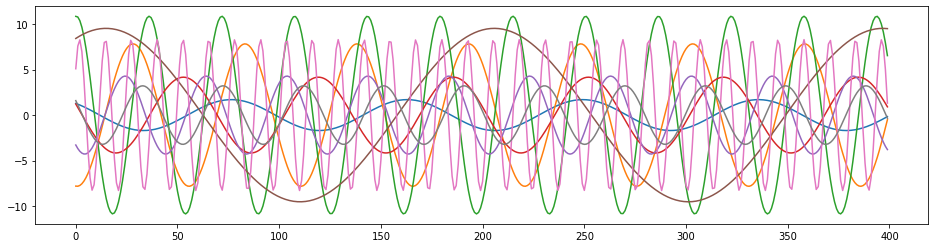

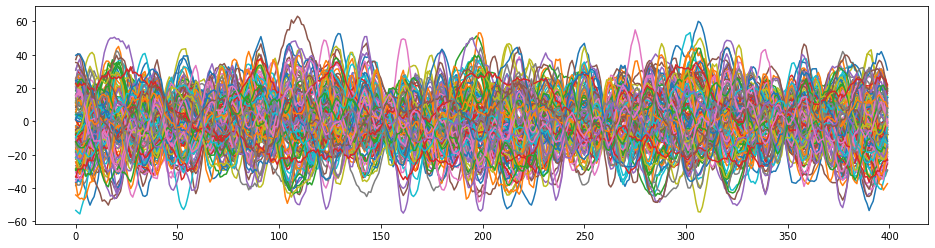

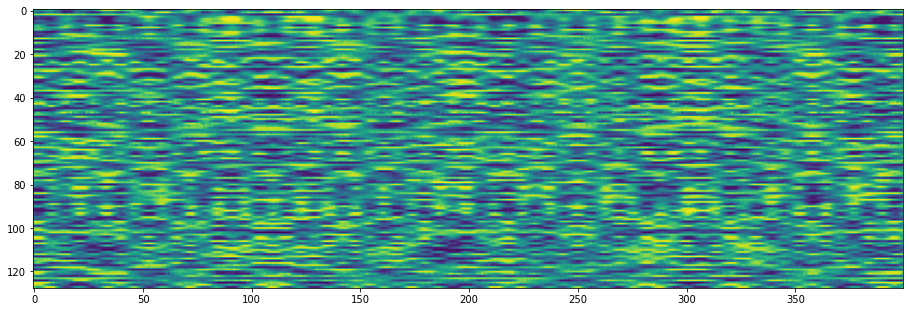

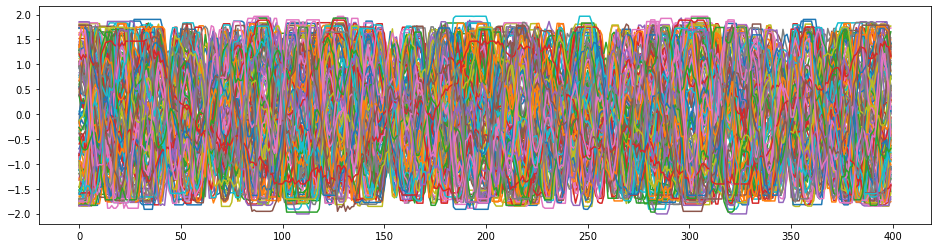

In [10]:
N = 10000
n_dim_in = 8
n_dim_out = 128
data_sin_pos = torch.arange(N).view(-1, 1).repeat(1, n_dim_in)
data_sin_amp = torch.rand(1, n_dim_in) * 10 + 1
data_sin_freq = 2 * np.pi / (torch.rand(1, n_dim_in) * 190 + 10)
data_sin_phase = 2 * np.pi * torch.rand(1, n_dim_in)
data_sin = data_sin_amp * torch.sin(data_sin_freq * data_sin_pos + data_sin_phase)

data_sin_orig = data_sin

a = data_sin[:400]
plt.figure(figsize=(16, 4))
plt.plot(a.numpy())
plt.show() 

data_sin = torch.mm(data_sin, torch.randn(n_dim_in, n_dim_out)) + (torch.rand(1, n_dim_out) * 10 - 5)
data_sin += torch.randn_like(data_sin) * 1
data_sin = data_sin.unsqueeze(0)

a = data_sin[0, :400]
plt.figure(figsize=(16, 4))
plt.plot(a.numpy())
plt.show() 

a = np.clip(a, *np.percentile(a, [5, 95], axis=0))
a = a - a.mean(dim=0, keepdims=True)
a = a / a.std(dim=0, keepdims=True)

plt.figure(figsize=(16, 16 * a.size(1) / a.size(0)))
plt.imshow(a.numpy().T)
plt.show()

plt.figure(figsize=(16, 4))
plt.plot(a.numpy())
plt.show() 

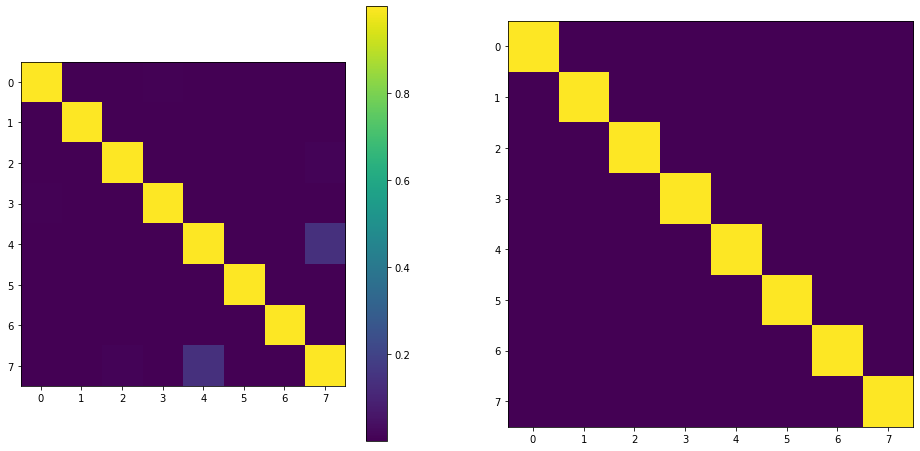

7.66 unique features


In [11]:
a = data_sin_orig
a = (a - a.mean(dim=0, keepdim=True)) / a.std(dim=0, keepdim=True)
mc = torch.mm(a.T, a).abs() / len(a)
_, axs = plt.subplots(1, 2, figsize=(8 * 2, 8))
_p1 = axs[0].imshow(mc.numpy())
axs[1].imshow(mc.numpy() > 0.5)
plt.colorbar(_p1, ax=axs[0])
plt.show()

print(f'{(1 / mc.mean()).item():.2f} unique features')

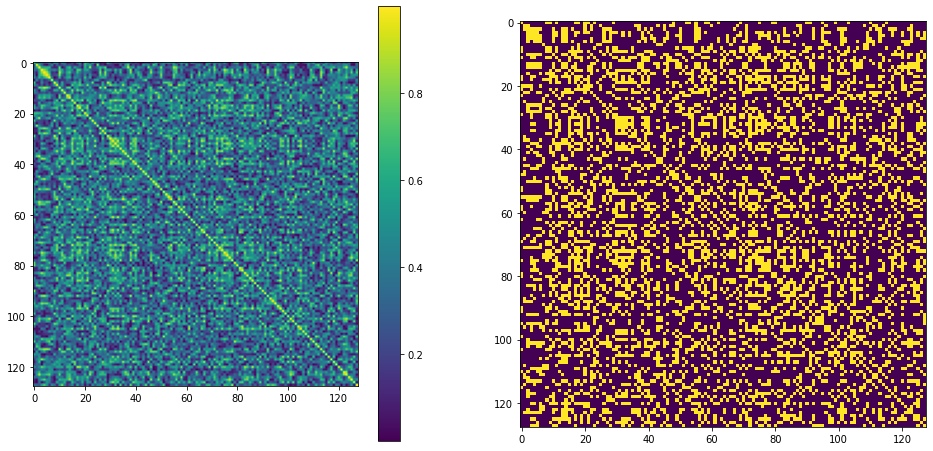

2.62 unique features


In [12]:
a = data_sin[0]
a = (a - a.mean(dim=0, keepdim=True)) / a.std(dim=0, keepdim=True)
mc = torch.mm(a.T, a).abs() / len(a)
_, axs = plt.subplots(1, 2, figsize=(8 * 2, 8))
_p1 = axs[0].imshow(mc.numpy())
axs[1].imshow(mc.numpy() > 0.5)
plt.colorbar(_p1, ax=axs[0])
plt.show()

print(f'{(1 / mc.mean()).item():.2f} unique features')

In [13]:
# !rm -r lightning_logs/

In [14]:
predict_w = np.ones(5)
predict_w = predict_w / predict_w.sum()
predict_w.round(3)

array([0.2, 0.2, 0.2, 0.2, 0.2])

In [15]:
class TSwapChannels(torch.nn.Module):
    def forward(self, x):
        return x.transpose(1, 2).contiguous()

In [44]:
class L2Norm(torch.nn.Module):
    def forward(self, x):
        return x / (x.pow(2).sum(dim=-1, keepdim=True) + 1e-12).pow(0.5)

In [87]:
# for sin
model = StreamEncoder(       
    encoder_x2z=torch.nn.Sequential(
        TBatchNorm(n_dim_out),
        ClipRange((-2.5, 2.5)),
        TDropout(0.3),
        TSwapChannels(),
        torch.nn.Conv1d(
            in_channels=n_dim_out, out_channels=32,   # 12
            kernel_size=8, stride=8, padding=0,
        ),
        TSwapChannels(),
#         torch.nn.Tanh(),
        L2Norm(),
#         torch.nn.Linear(n_dim_out, 12),
    ),
    history_size=10, predict_range=np.arange(5), predict_w=predict_w,
    z_channels=32, c_channels=32,
    lr=0.0002, weight_decay=0.0, step_size=10, gamma=0.9,
#     cpc_w=0.1, cov_z_w=0.01, var_z_w=0.08, cov_c_w=16.0, var_c_w=2.0, cpc_neg_w=0.0,
    cpc_w=0.0, cov_z_w=0.5, var_z_w=0.0, cov_c_w=0.0, var_c_w=0.0, cpc_neg_w=1.0,
)

In [88]:
trainer = pl.Trainer(
    gpus=[3],
    max_epochs=100,
    log_every_n_steps=10,
    progress_bar_refresh_rate=50, weights_summary=None,
    logger=pl.loggers.TensorBoardLogger(
        save_dir='lightning_logs/',
        default_hp_metric=False,
    )
)

In [89]:
l3dt = Loader3DTensor(model)
train_dl = l3dt.get_train_dataloader(data_sin[:, :5000], 128, 4, compress_factor=8)
valid_dl = l3dt.get_valid_dataloader(data_sin[:, 5000:], 16, 0)

In [90]:
batch = next(iter(train_dl))[0]

In [91]:
trainer.fit(model, train_dataloader=train_dl, val_dataloaders=valid_dl)

Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

# Tuning

In [60]:
def r_exp(b, m):
    a = b / m
    b = b * m
    a = np.log(a)
    b = np.log(b)
    
    return np.exp(np.random.random(1)[0] * (b - a) + a)

In [61]:
best_model = StreamEncoder.load_from_checkpoint(
    'lightning_logs/default/version_4/checkpoints/epoch=99-step=3899.ckpt')

In [79]:
for i in range(10):
    mul_c = 1 + 2 ** 1
    params = dict(
        lr=r_exp(best_model.hparams.lr, mul_c),
        cpc_w=0.1,
        cov_z_w=r_exp(best_model.hparams.cov_z_w, mul_c),
        var_z_w=r_exp(best_model.hparams.var_z_w, mul_c),
        cov_c_w=r_exp(best_model.hparams.cov_c_w, mul_c),
        var_c_w=r_exp(best_model.hparams.var_c_w, mul_c),
#         adam_beta1 = 1 - np.exp(((np.log(0.5) - np.log(0.1)) * np.random.rand(1)[0]) + np.log(0.1)),
#         adam_beta2 = 1 - np.exp(((np.log(0.5) - np.log(0.001)) * np.random.rand(1)[0]) + np.log(0.001)),
    )
    print(f'[{i:04d}] - start', end='')
    stream_encoder = StreamEncoder(
        **{k: v for k, v in best_model.hparams.items() if k in (
            'history_size', 'predict_range', 'predict_w',
            'var_gamma_z', 'var_gamma_c', 'step_size', 'gamma',
            'weight_decay', 'z_channels', 'c_channels',
            'adam_beta1', 'adam_beta2',
#             'lr', 'cpc_w', 'cov_z_w', 'var_z_w', 'cov_c_w', 'var_c_w',
        )},
        **params,
        encoder_x2z=torch.nn.Sequential(
            TBatchNorm(n_dim_out),
            ClipRange((-2.5, 2.5)),
            TDropout(0.3),
            torch.nn.Linear(n_dim_out, 16),
        ),   
    )
    trainer = pl.Trainer(
        gpus=[3],
        max_epochs=100,
        log_every_n_steps=50,
        progress_bar_refresh_rate=0, weights_summary=None,
        logger=pl.loggers.TensorBoardLogger(
            save_dir='lightning_logs/',
            default_hp_metric=False,
        )
    )

    trainer.fit(stream_encoder, train_dataloader=train_dl, val_dataloaders=valid_dl)
    print(' - done')

[0000] - start - done
[0001] - start - done
[0002] - start - done
[0003] - start - done
[0004] - start - done
[0005] - start - done
[0006] - start - done
[0007] - start - done
[0008] - start - done
[0009] - start - done


# Inference

In [21]:
model = StreamEncoder.load_from_checkpoint('lightning_logs/default/version_6/checkpoints/epoch=199-step=7799.ckpt')

FileNotFoundError: [Errno 2] No such file or directory: '/mnt2/kireev/pycharm-deploy/pytorch-lifestream/experiments/sensors/lightning_logs/default/version_6/checkpoints/epoch=199-step=7799.ckpt'

In [92]:
print(model.hparams)

"c_channels":    32
"cov_c_w":       0.0
"cov_z_w":       0.5
"cpc_neg_w":     1.0
"cpc_w":         0.0
"encoder_x2z":   Sequential(
  (0): TBatchNorm(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (1): ClipRange()
  (2): TDropout()
  (3): TSwapChannels()
  (4): Conv1d(128, 32, kernel_size=(8,), stride=(8,))
  (5): TSwapChannels()
  (6): L2Norm()
)
"gamma":         0.9
"history_size":  10
"lr":            0.0002
"neg_count":     8
"predict_range": [0 1 2 3 4]
"predict_w":     [0.2 0.2 0.2 0.2 0.2]
"step_size":     10
"var_c_w":       0.0
"var_gamma_c":   (0.3, 0.3)
"var_gamma_z":   (0.3, 0.3)
"var_z_w":       0.0
"weight_decay":  0.0
"z_channels":    32


# Eval

In [93]:
model.eval()

with torch.no_grad():
    z, c = model(data_sin)
    p = {i: l(c) for i, l in zip(model.hparams.predict_range, model.lin_predictors_c2p)}

In [94]:
B, T, C = data_sin.size()
x = data_sin.view(B, T // 8, 8, C).mean(dim=2)

In [95]:
x, z, c = [t[:, 5000 // 8:7000 // 8] for t in [x, z, c]]
p = {k: v[:, 5000 // 8:7000 // 8] for k, v in p.items()}

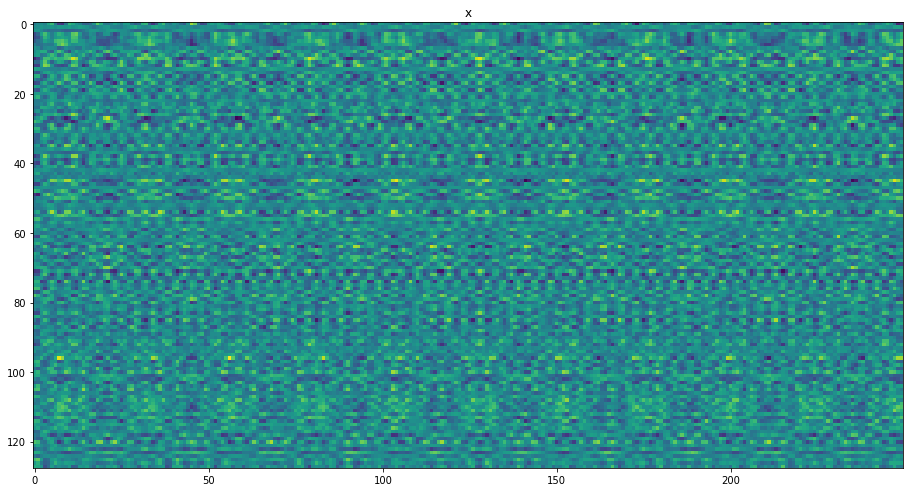

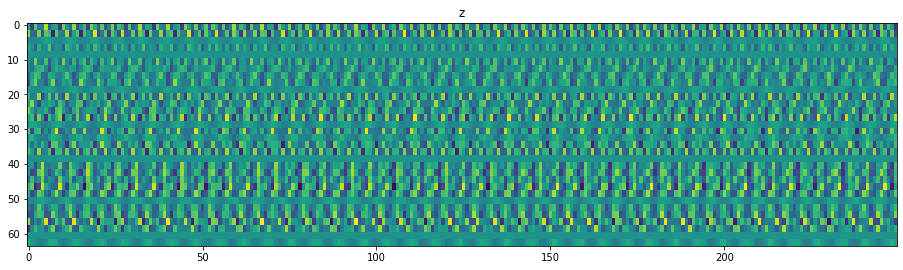

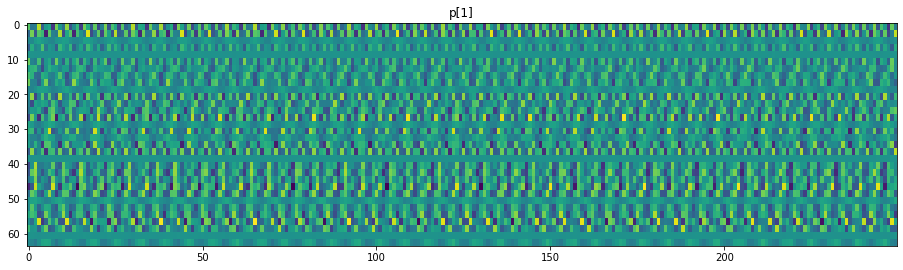

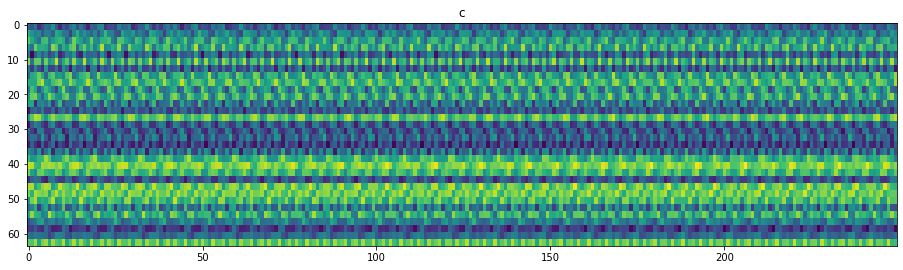

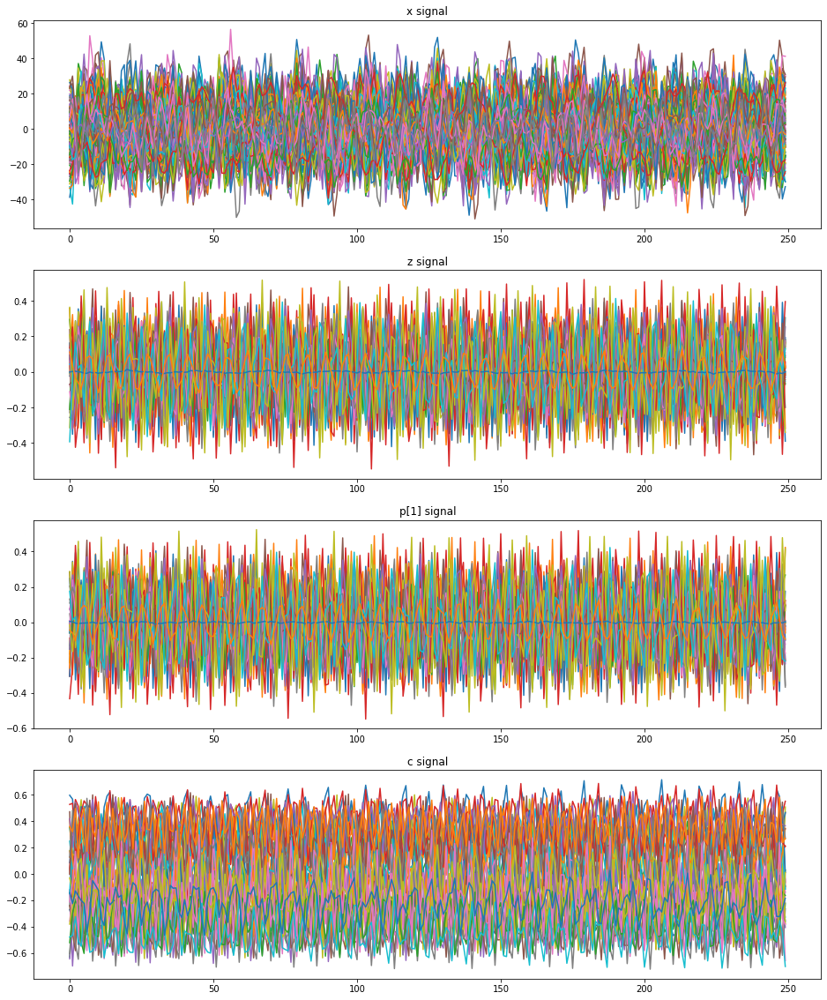

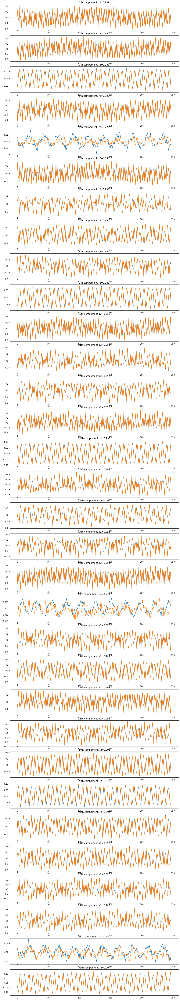

r2_score = 0.895
z_self_corr = 0.264
z_unique_features = 3.474
cpc_pow = 3.110


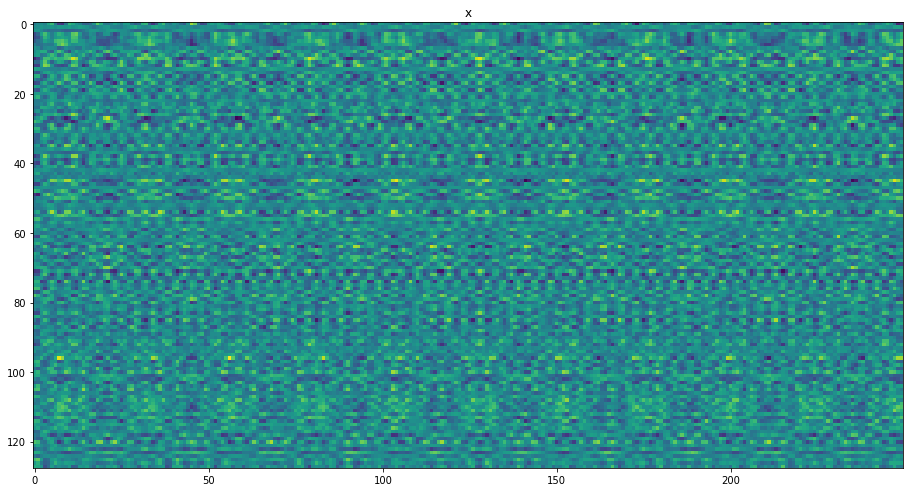

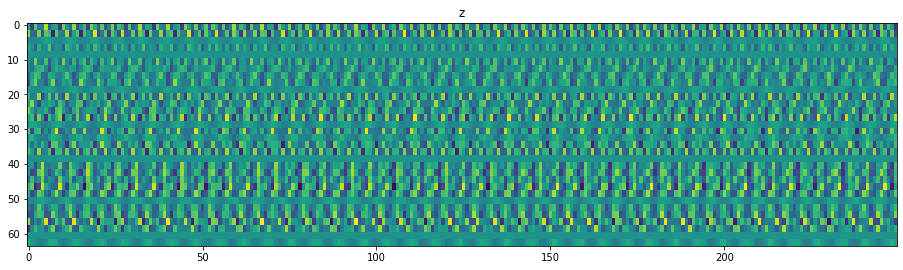

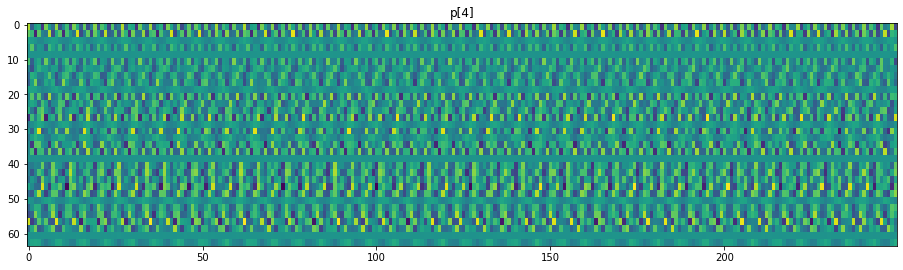

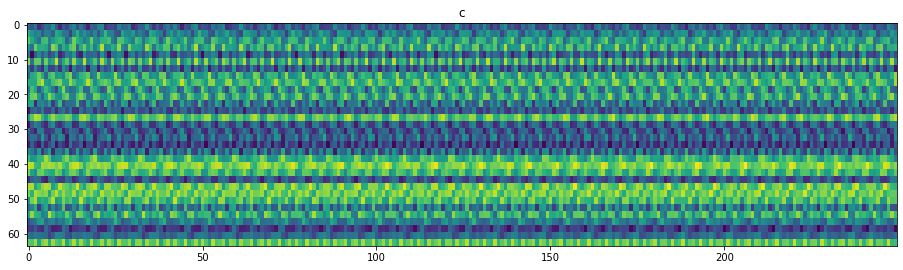

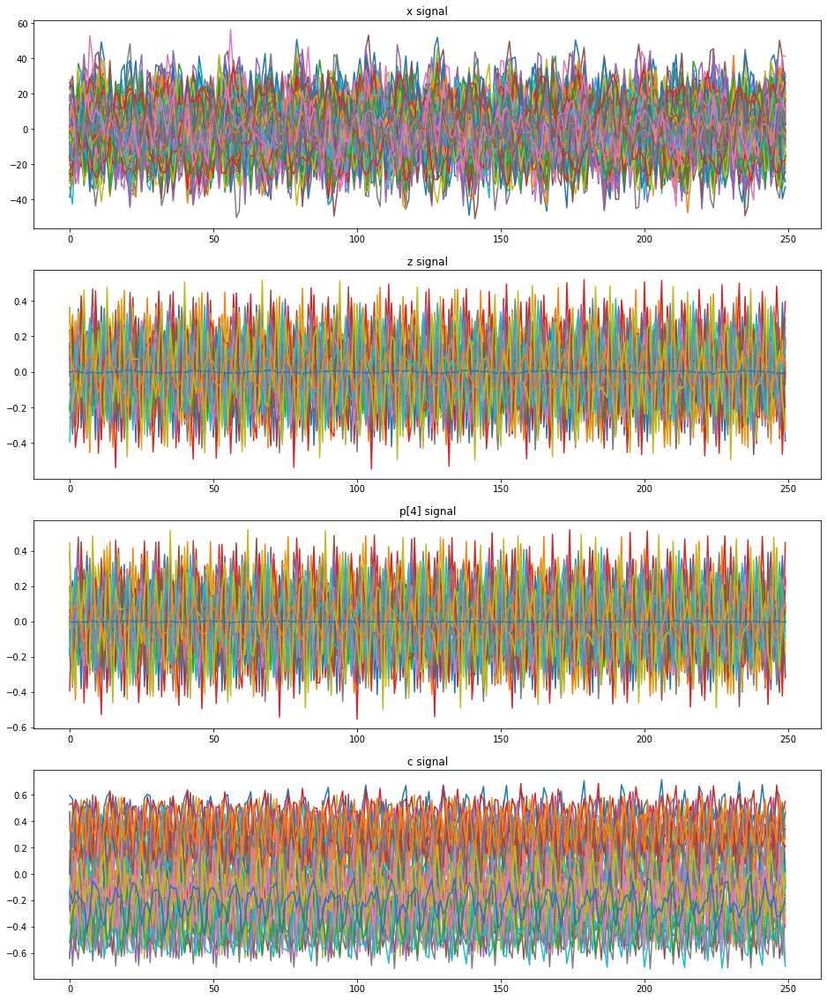

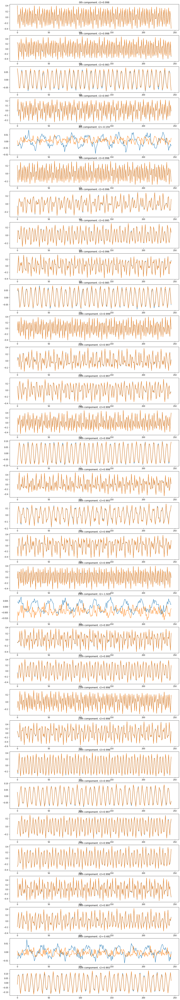

r2_score = 0.822
z_self_corr = 0.264
z_unique_features = 3.474
cpc_pow = 2.856


In [96]:
for pred_h in [1, 4]:
    a = x.unsqueeze(-1).repeat(1, 1, 1, 1).view(*x.size()[:-1], -1)[0].detach().numpy()
    plt.figure(figsize=(16, 16 * a.shape[1] / a.shape[0]))
    plt.imshow(a.T)
    plt.title('x')
    plt.show()

    a = z.unsqueeze(-1).repeat(1, 1, 1, 2).view(*z.size()[:-1], -1)[0].detach().numpy()
    plt.figure(figsize=(16, 16 * a.shape[1] / a.shape[0]))
    plt.imshow(a.T)
    plt.title('z')
    plt.show()

    a = p[pred_h].unsqueeze(-1).repeat(1, 1, 1, 2).view(*p[pred_h].size()[:-1], -1)[0].detach().numpy()
    plt.figure(figsize=(16, 16 * a.shape[1] / a.shape[0]))
    plt.imshow(a.T)
    plt.title(f'p[{pred_h}]')
    plt.show()

    a = c.unsqueeze(-1).repeat(1, 1, 1, 2).view(*c.size()[:-1], -1)[0].detach().numpy()
    plt.figure(figsize=(16, 16 * a.shape[1] / a.shape[0]))
    plt.imshow(a.T)
    plt.title('c')
    plt.show()

    _, axs = plt.subplots(4, 1, figsize=(16, 5 * 4))
    axs[0].plot(x[0].detach().numpy())
    axs[0].set_title('x signal')
    axs[1].plot(z[0].detach().numpy())
    axs[1].set_title('z signal')
    axs[2].plot(p[pred_h][0].detach().numpy())
    axs[2].set_title(f'p[{pred_h}] signal')
    axs[3].plot(c[0].detach().numpy())
    axs[3].set_title('c signal')
    plt.show()

    pred_horizon = pred_h + 1
    _, axs = plt.subplots(z.size(2), 1, figsize=(16, 3 * z.size(2)))
    for i, ax in zip(range(z.size(2)), axs):
        ax.plot(z[0, pred_horizon:, i].detach().numpy())
        ax.plot(p[pred_h][0, :-pred_horizon, i].detach().numpy())
        r2_score = 1 - (z[0, pred_horizon:, i] - p[pred_h][0, :-pred_horizon, i]).pow(2).sum() / \
            ((z[0, pred_horizon:, i] - z[0, pred_horizon:, i].mean(dim=0, keepdim=True)).pow(2).sum() + 1e-6)
        ax.set_title(f'{i}th compoment. r2={r2_score:.3f}')
    plt.show()

    r2_score = 1 - (z[:, pred_horizon:] - p[pred_h][:, :-pred_horizon]).pow(2).sum(dim=1) / \
        ((z[:, pred_horizon:] - z[:, pred_horizon:].mean(dim=1, keepdim=True)).pow(2).sum(dim=1) + 1e-6)
    print(f'r2_score = {r2_score.mean():.3f}')

    _z = (z - z.mean(dim=1, keepdims=True)) / (z.std(dim=1, keepdims=True) + 1e-6)
    mc = torch.bmm(_z.transpose(1, 2), _z).abs() / _z.size(1)
    C = mc.size(1)
    off_diag_ix = (1 - torch.eye(C)).bool().view(-1)
    m = mc.view(-1, C * C)[:, off_diag_ix].mean()
    print(f'z_self_corr = {m:.3f}')
    print(f'z_unique_features = {1 / (mc.mean() + 1e-3):.3f}', )
    print(f'cpc_pow = {r2_score.mean() / (mc.mean() + 1e-3):.3f}')

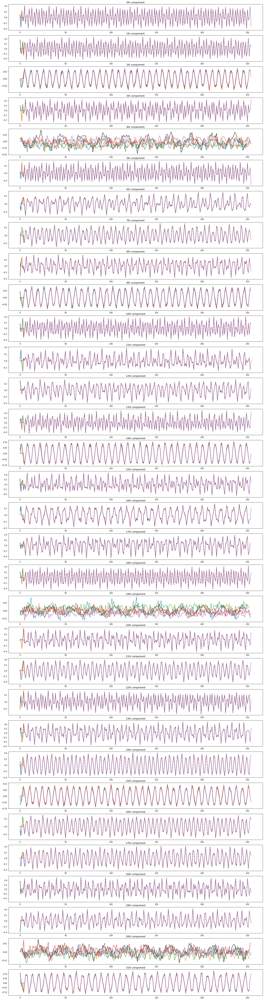

In [97]:
_, axs = plt.subplots(z.size(2), 1, figsize=(24, 3 * z.size(2)))
for i, ax in zip(range(z.size(2)), axs):
    ax.plot(z[0, :, i].numpy(), color='black')
    for j, ph in p.items():
        ax.plot(np.concatenate([[0] * (j + 1), ph[0, :, i].numpy()]))
    ax.set_title(f'{i}th compoment')
plt.show()


In [66]:
from sklearn.decomposition import PCA

In [67]:
(PCA(n_components=data_sin_orig.size(1)).fit(data_sin_orig).explained_variance_ratio_.cumsum() < 0.99).sum() + 1

7

In [68]:
(PCA(n_components=x.size(2)).fit(x[0]).explained_variance_ratio_.cumsum() < 0.99).sum() + 1

7

In [69]:
(PCA(n_components=z.size(2)).fit(z[0]).explained_variance_ratio_.cumsum() < 0.99).sum() + 1

10